In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

# GM0 Performance Evaluation

**IMPORTANT**: This notebook should be used as a base for the evaluation of different models. 

- Please **make a copy of this notebook** whenever you want to evaluate a model. Load the desired model by changing the following `model_path_str` variable. 
- This notebook is currently not saving any generated plot. Please make sure to not overwrite the outputs, or to save the plots whenever needed. 
- This notebook saves the generated data. Please refer to the Evaluation section of this notebook. 

Available models on the SDSC shared folder: 

In [3]:
!ls /store/sdsc/sd28/models/GM0/diffusion/

1D-UNET-DDPM-envelope
consistency-model-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05
ddim-pred:epsilon-1D_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:1_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_LogSpectrogram-{}
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-first_order_lp-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-hilbert-log-log_offset:1.0e-05-normalize-scalar:True
ddim-pred:sample-1D-dow

In [1]:
dataset_folder = "../outputs/"

One can either choose a specific checkpoint of a model or the most recent checkpoint of that model (default):

In [2]:
# Pick the last checkpoint of the model
model_path_str = dataset_folder + "ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True"

# Or pick a specific checkpoint
# model_path_str = dataset_folder + "/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average_shifted-log-log_offset:1.0e-05-normalize-scalar:True/name=0_epoch=125-val_loss=0.02.ckpt"

Import the needed libraries, modules and needed variables

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os

from pathlib import Path
from tqdne.utils import *
from tqdne.conf import Config
from tqdne.metric import *

from tqdne.dataset import EnvelopeDataset 
from torch.utils.data import DataLoader, ConcatDataset


/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [4]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    torch.cuda.empty_cache()
else: 
    device = torch.device('cpu')

torch.cuda.is_available(), device

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/torch/cuda/__init__.py:628: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


(False, device(type='cpu'))

In [5]:
config = Config()

# Select the signal length
signal_length = config.signal_length 

# Set the sampling frequency
fs = config.fs

# Set the number of channels of the original waveforms  
n_channels = config.num_channels

# Set the conditioning parameters range
cond_params_range = config.conditional_params_range

Load the model

2024-05-21 12:42:38 - root - INFO - Last checkpoint is : ../outputs/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True/name=0_epoch=144-val_loss=0.46.ckpt
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'net' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['net'])`.


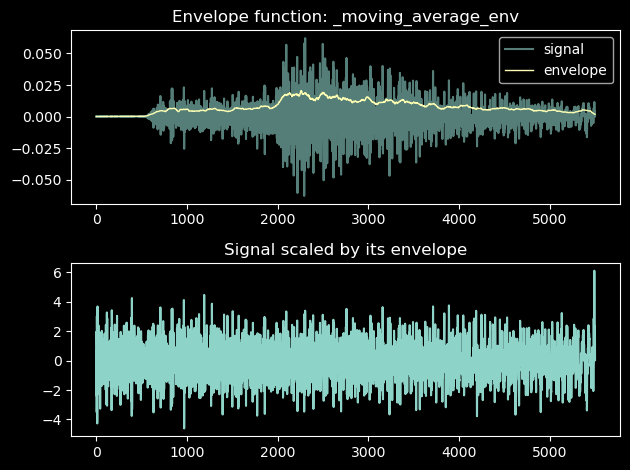

Model: LightningDiffusion
Number of learnable parameters: 9704198
Model size: 117.02 MB
UNet scheme: 
 base num. channels: 32 
 channel multipliers (down/up blocks): (1, 2, 4, 8) 
 num. ResBlocks per down/up block: 2 
 use Attention: True 
 conv. kernel size: 5 
Diffusion prediction type: sample
Learning rate schedule: 
 start: 0.0003 
 scheduler: cosine 
 warmup steps: 500
Batch size: 128
Downsampling factor: 2. The model was trained on signals with length 2736, as the sampling rate used was 50 instead of 100
Data representation shape: (1, 6, 5472) (batch_size, channels, signal_length)
Data representation name: SignalWithEnvelope
ckpt file: ../outputs/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-log-log_offset:1.0e-05-normalize-scalar:True/name=0_epoch=144-val_loss=0.46.ckpt


In [6]:
model, model_data_repr, ckpt = load_model(Path(model_path_str), use_ddim=False)
model.to(device)
model.eval()
print_model_info(model, model_data_repr, ckpt)

Restore the sampling rate and signal length that were used during training

In [7]:
if "downsampling" in model_path_str:
    downsampling = int(model_path_str.split("downsampling:")[1].split("_")[0])
    fs = fs // downsampling
    signal_length = signal_length // downsampling
    config.signal_length = signal_length
    config.fs = fs
    print(f"Updated signal length: {config.signal_length} and fs: {config.fs}")
else:
    downsampling = 1    

Updated signal length: 2736 and fs: 50


Let's generate a batch of data

In [8]:
# Select the batch size.
batch_size = model.hparams.optimizer_params.batch_size

# One can also choose the batch size
# batch_size = 32

batch_size

128

In [9]:
# Insert values for the conditional input parameters.
# Please read generate_cond_inputs documentation (in utils.py) to understand the structure of cond_input_params dictionary
cond_input_params = {
    "hypocentral_distance": [10, 100, 150],
    "is_shallow_crustal": [0],
    "magnitude": [5.5, 4, 7, 8.5],
    "vs30": None,
}

data_raw = generate_data(model, model_data_representation=model_data_repr, raw_output=True, num_samples=batch_size, cond_input_params=cond_input_params, device=device.type, max_batch_size=batch_size)
data_raw['waveforms'].shape, data_raw['cond'].shape

Batch 1/1


100%|██████████| 100/100 [00:26<00:00,  3.83it/s]


((128, 6, 2736), (128, 4))

In [13]:
data_raw_wf = data_raw['waveforms']
data_raw_wf.shape

(128, 6, 2736)

In [14]:
data_wf = model_data_repr.invert_representation(data_raw_wf)
data_wf.shape

(128, 3, 2736)

## Single Sample Visualization

Let's investigate model's raw output 

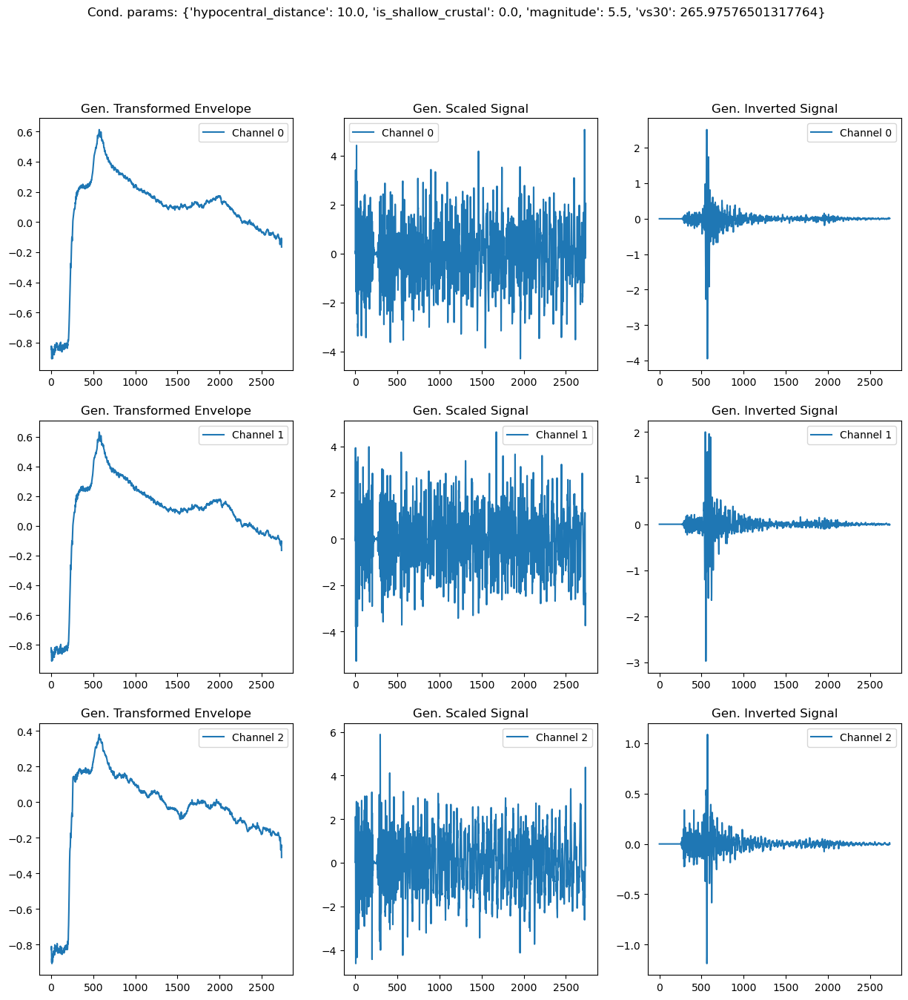

In [15]:
sample_index = 0
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

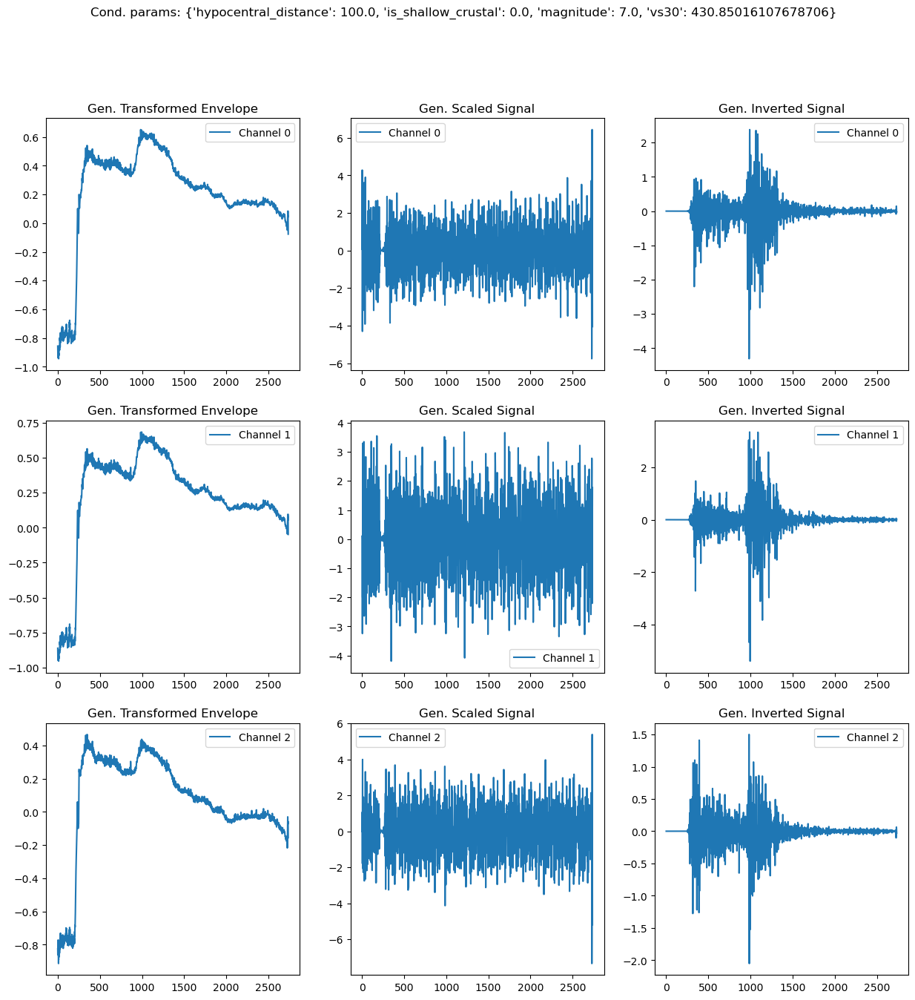

In [16]:
sample_index = 3
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

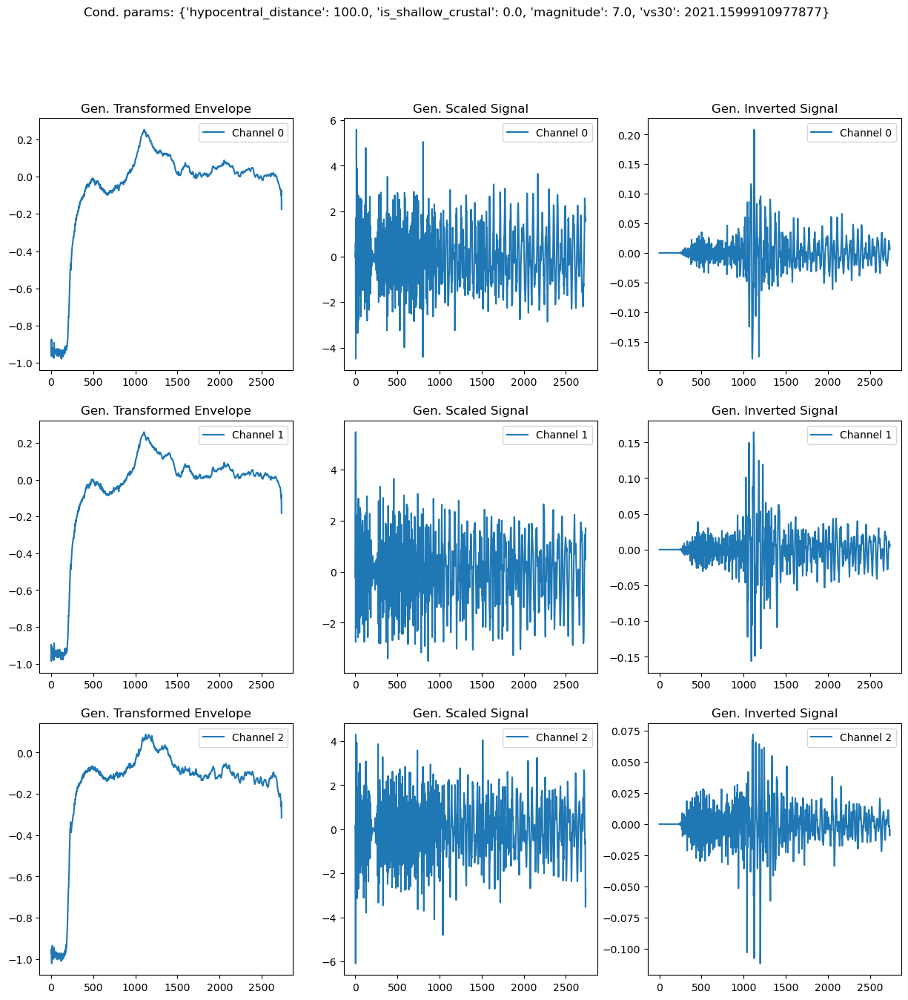

In [17]:
sample_index = 10
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

In [18]:
# TODO: works only for 1D signals, need to generalize to 2D signals. However, is only useful for 1D signals.
# max_peak_index = np.argmax(np.max(np.abs(data_raw_wf), axis=(1, 2)))
# plot_raw_waveform(data_raw_wf[max_peak_index], n_channels, data_wf[max_peak_index])

Let's now see the generated waveforms, along with their Power Spectral Density and Log Envelope. 

In [19]:
data = {"waveforms": data_wf, "cond": data_raw['cond']}

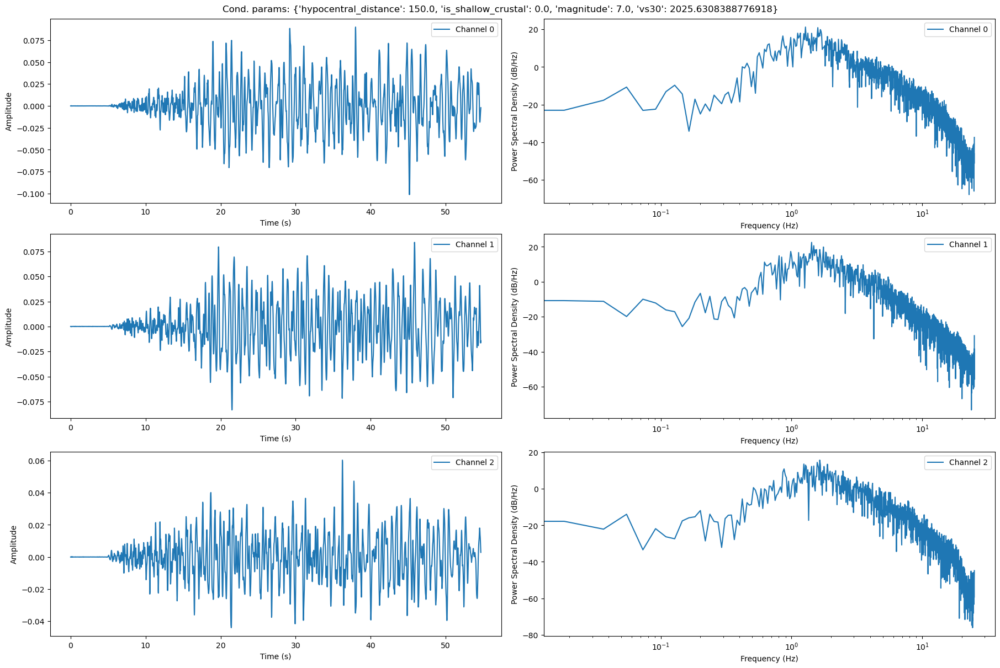

In [20]:
plot_waveform_and_psd(get_samples(data, num_samples=1))

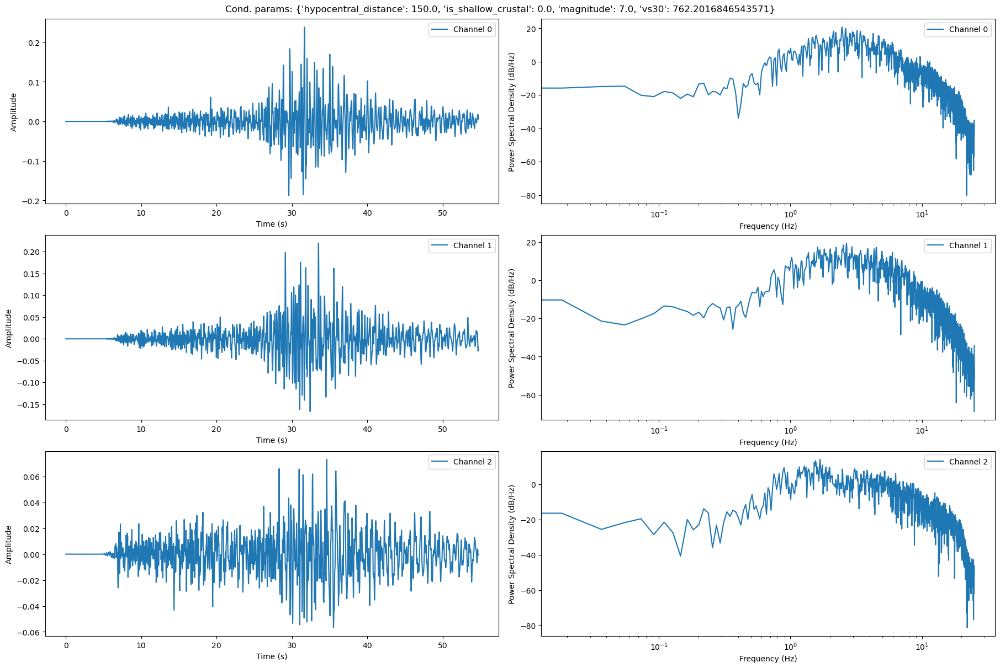

In [21]:
plot_waveform_and_psd(get_samples(data, indexes=[2]))

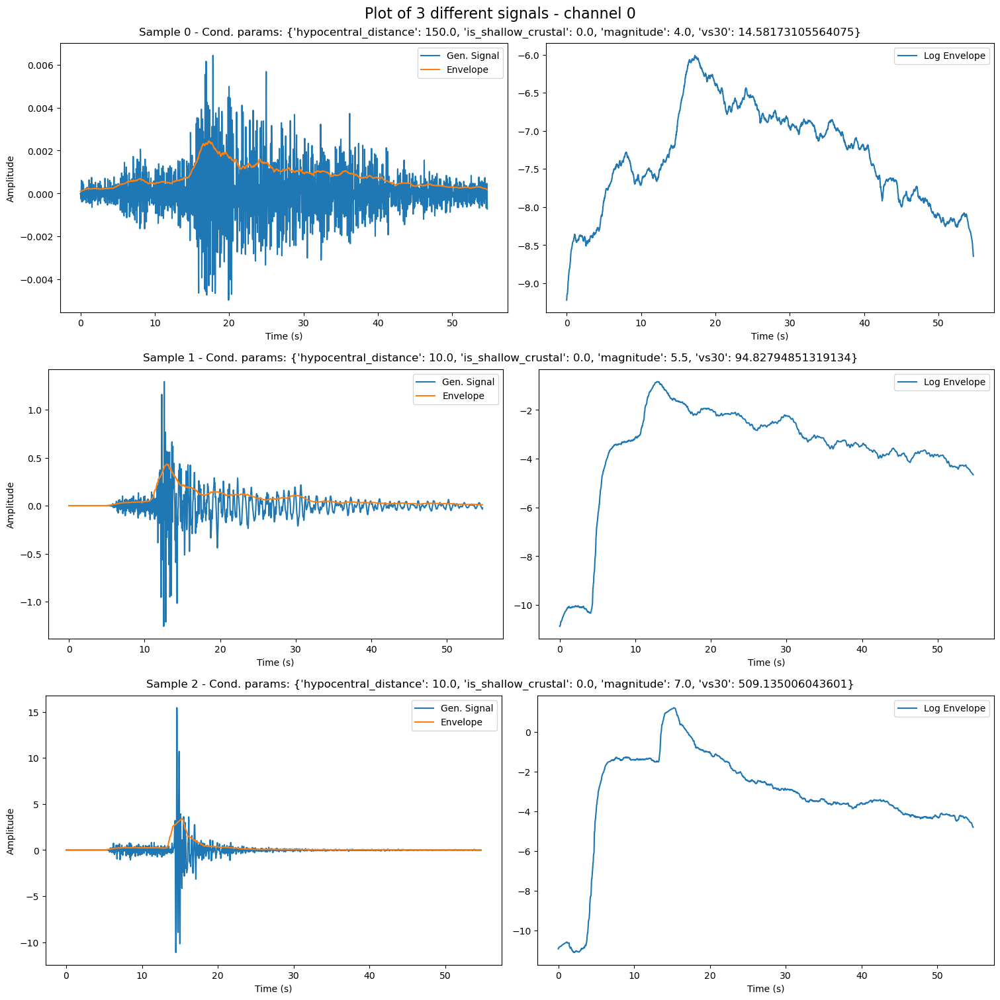

In [22]:
plot_waveforms(get_samples(data, num_samples=3), channel_index=0, plot_log_envelope=True)

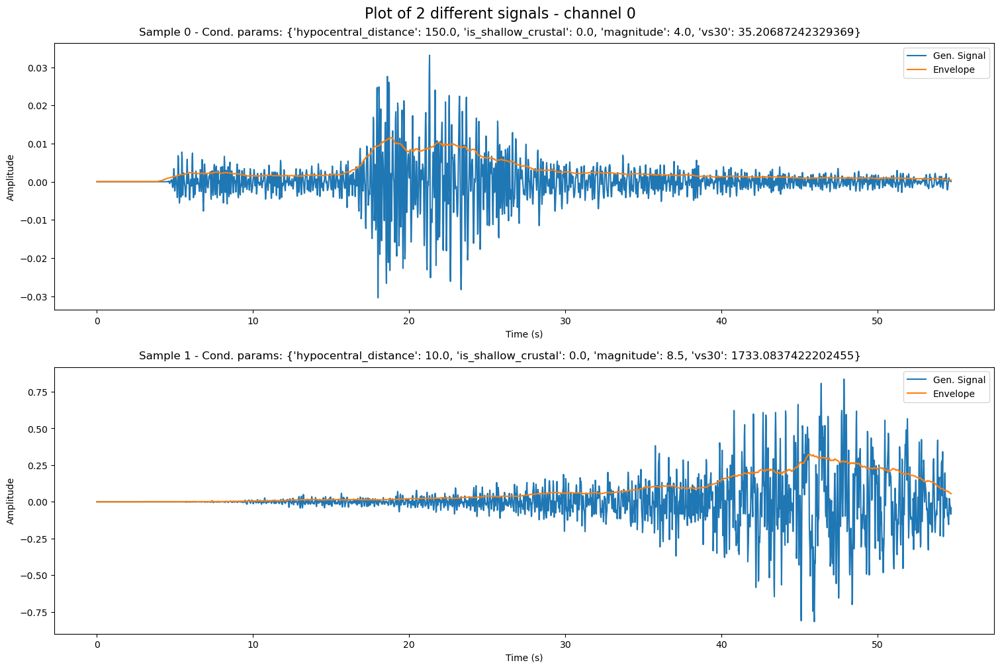

In [23]:
plot_waveforms(get_samples(data, num_samples=2), channel_index=0, plot_log_envelope=False)

## Batch Statistics

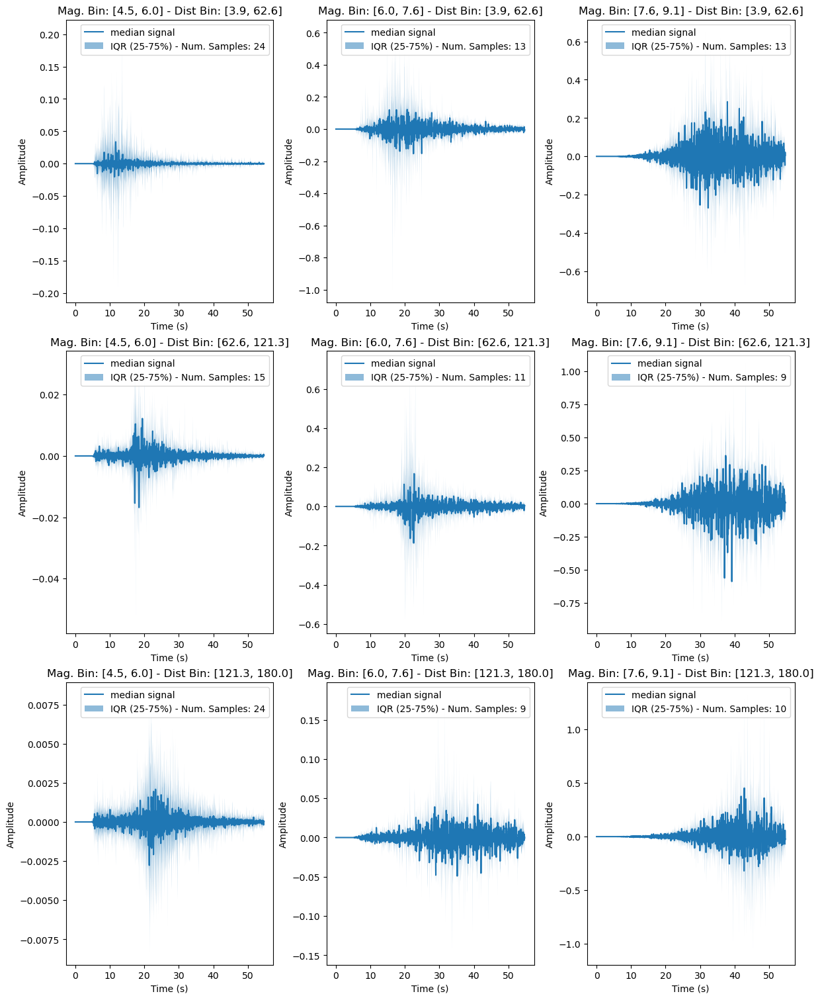

In [24]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='waveform')

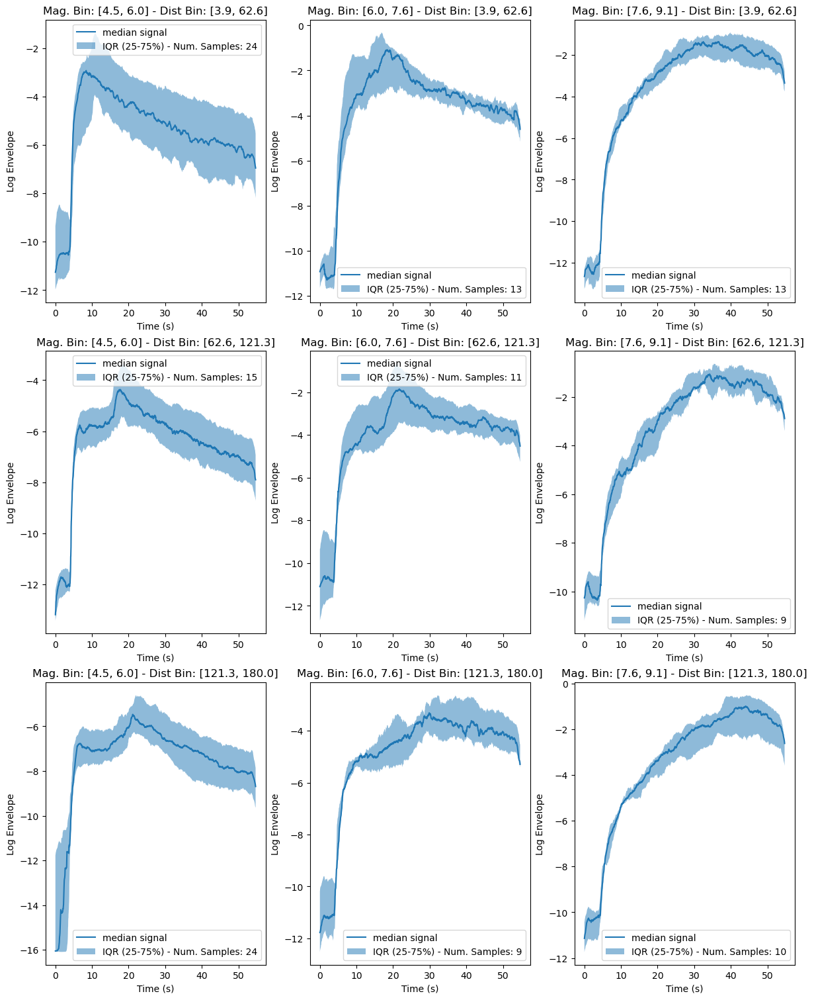

In [25]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='log_envelope')

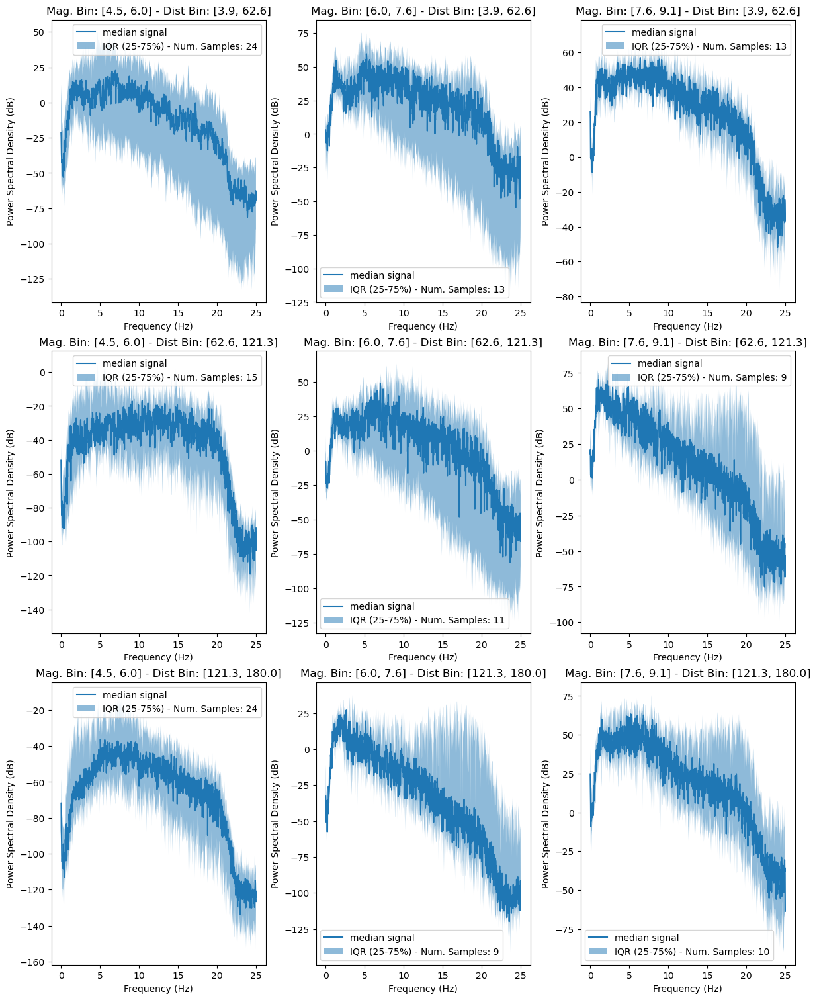

In [26]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='power_spectral_density')

In [27]:
del data
del data_raw

## Evaluation

In [9]:
from tqdne.representations import Signal

test_dataset_path = config.datasetdir / config.data_test
train_dataset_path = config.datasetdir / config.data_train

test_dataset = EnvelopeDataset(test_dataset_path, Signal(), cut=config.signal_length*downsampling, downsample=downsampling)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
train_dataset = EnvelopeDataset(train_dataset_path, Signal(), cut=config.signal_length*downsampling, downsample=downsampling)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

real_dataset = ConcatDataset([train_dataset, test_dataset])
real_dataloader = DataLoader(real_dataset, batch_size=batch_size, shuffle=False)

Let's generate couple of samples with the same conditioning parameters to check the expressiveness of the model and check if it lies within the true data distribution. 

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 40.64it/s]


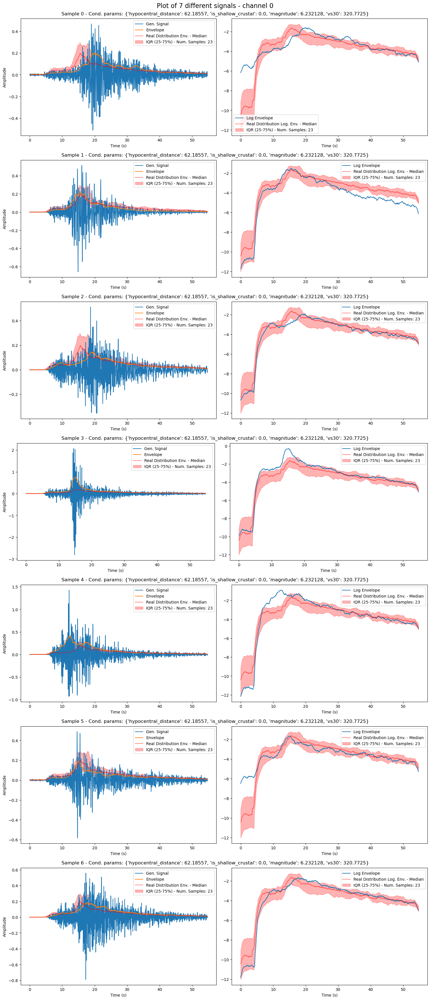

In [11]:
mag_bin = (6, 6.5)
dist_bin = (50, 70)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = np.mean(data_test_single_bin['cond'], axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type, max_batch_size=batch_size)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveforms'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 41.20it/s]


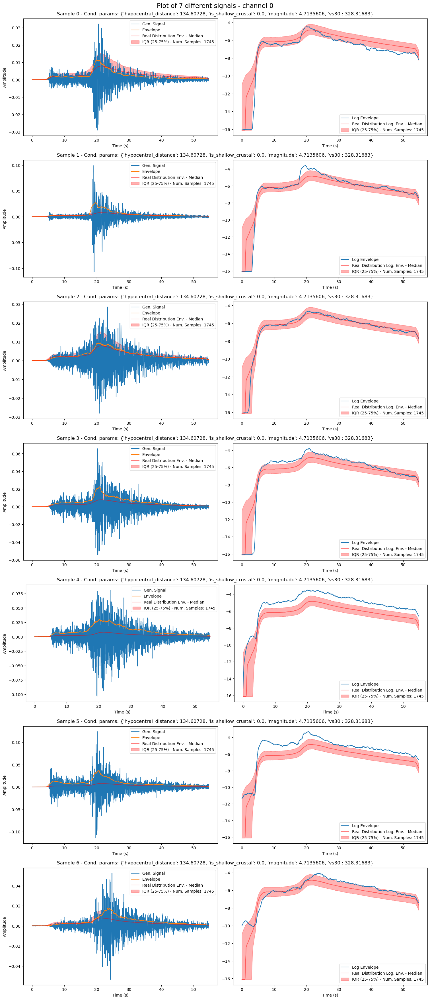

In [12]:
mag_bin = (4, 5)
dist_bin = (120, 150)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = np.mean(data_test_single_bin['cond'], axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type, max_batch_size=batch_size)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveforms'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 41.49it/s]


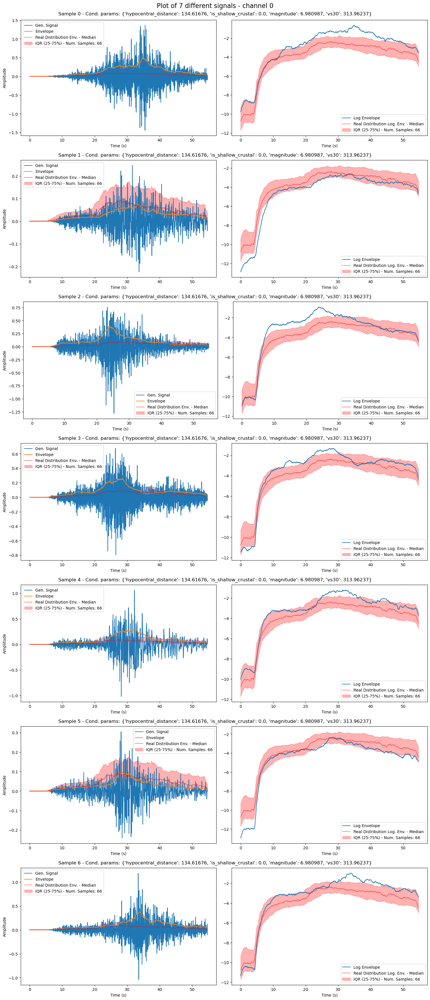

In [13]:
mag_bin = (6.5, 9.)
dist_bin = (120, 150)
data_real_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = np.mean(data_real_single_bin['cond'], axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type, max_batch_size=batch_size)

plot_waveforms(data_pred_single_bin, test_waveforms=data_real_single_bin['waveforms'])

Let's now compare the statistics of the generated data wrt the real data.

In [10]:
real_data = {
    "waveforms": np.concatenate([test_dataset.get_waveforms(), train_dataset.get_waveforms()], axis=0),
    "cond": np.concatenate([test_dataset.features, train_dataset.features], axis=0)
}
real_data['waveforms'].shape, real_data['cond'].shape

((212598, 3, 2736), (212598, 4))

Now let's generate more samples to perform an analysis by dividing the data in bins (magnitude and distance). 

Let's save the generated data future use.

The data will be saved as a `dict` with keys `waveforms` and `cond` in the same place of the checkpoint of the selected model, with the same name of `ckpt`, except for the extension of the file (saved as a HDF5 `.hdf5` file).
The optimal approach for downloading the generated dataset to a local storage location is to replace the string `hdf5_filename` with the desired filename, thus enabling the file to be stored in the current directory. This file may then be downloaded via the integrated visual interface of VSCode or JupyterLab. 


In [11]:
# Save the generated waveforms along with the conditioning parameters
hdf5_filename = f"{str(ckpt).replace('.ckpt', '.hdf5')}"
hdf5_filepath = Path(hdf5_filename)

In [34]:
# Generate waveforms with the same conditioning parameters of the real data
generated_raw_data = generate_data(
    model, 
    model_data_repr, 
    raw_output=True, 
    num_samples=real_data['waveforms'].shape[0], 
    cond_input=real_data['cond'], 
    device=device.type, 
    max_batch_size=batch_size, 
    save_path=hdf5_filepath
)

generated_raw_data['waveforms'].shape, generated_raw_data['cond'].shape

Batch 1/1660


100%|██████████| 100/100 [00:23<00:00,  4.21it/s]


Batch 2/1660


100%|██████████| 100/100 [00:23<00:00,  4.21it/s]


Batch 3/1660


100%|██████████| 100/100 [00:23<00:00,  4.21it/s]


Batch 4/1660


  3%|▎         | 3/100 [00:00<00:23,  4.17it/s]


KeyboardInterrupt: 

Let's check the raw outputs by comparing them statistically with real data in the representation domain. 

In [ ]:
#plot_raw_output_distribution(generated_raw_data["waveforms"], real_data['waveforms'], model_data_repr)

In [12]:
# check if generated_data is available
if 'generated_data' in locals():
    generated_data = {"waveforms": model_data_repr.invert_representation(generated_raw_data['waveforms']), "cond": generated_raw_data['cond']}
    del generated_raw_data
    # if samples are available in a preexisting file, append the new samples to generated_data
    if hdf5_filepath.exists():
        with h5py.File(hdf5_filepath, 'r') as f:
            generated_data = {k: np.concatenate([generated_data[k], f[k][:]], axis=0) for k in generated_data.keys()}
else:
    # load the file hdf5_filename
    with h5py.File(hdf5_filepath, 'r') as f:
        generated_data = {"waveforms": f['waveforms'][:], "cond": f['cond'][:]}

generated_data['waveforms'].shape, generated_data['cond'].shape

((244962, 3, 2736), (244962, 4))

And let's now compare the generated data against the real ones. 

In [17]:
distance_bins = [(0, 40), (40, 60), (60, 80), (80.0, 120.), (120., 150.), (150., 200.)]
magnitude_bins = [(4.5, 5.0), (5., 5.5), (5.5, 6.0), (6.0, 7.0), (7.0, 9.0)]

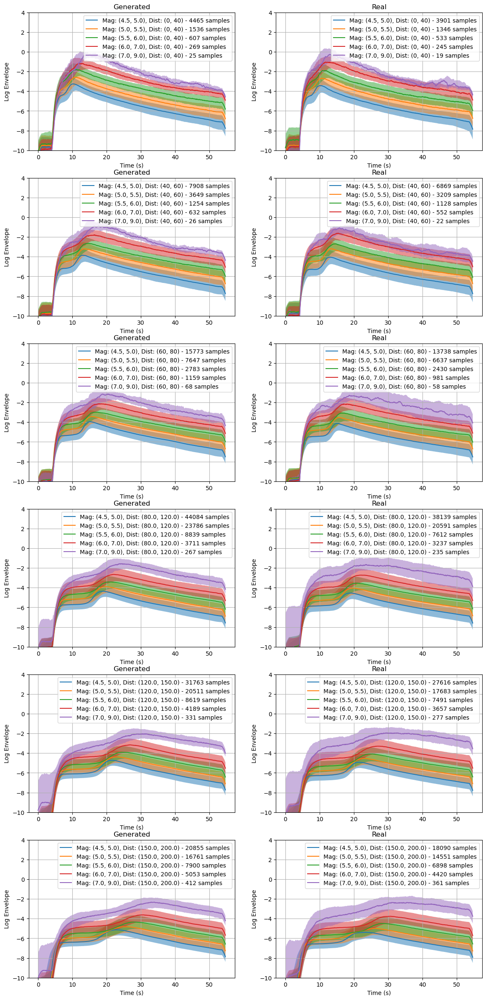

In [18]:
plot_bins(
    plot_type='log_envelope',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation = model_data_repr
)

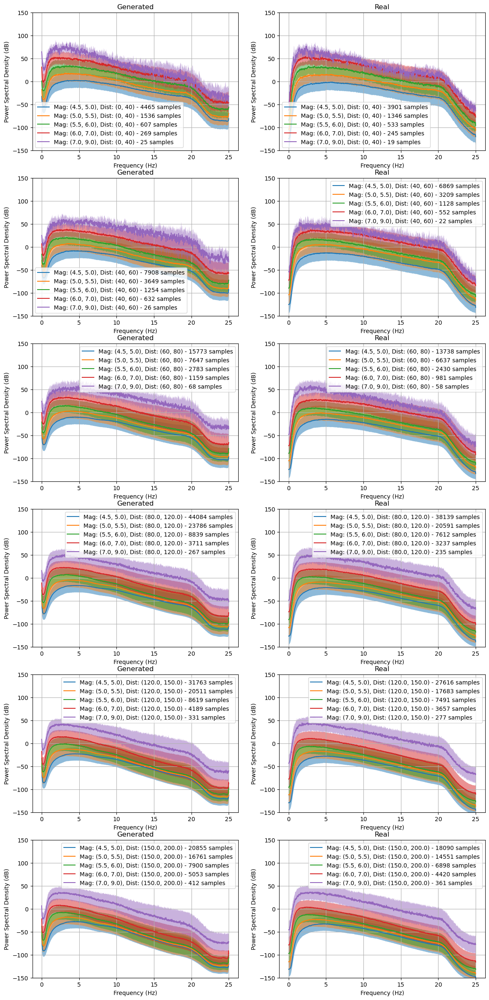

In [19]:
plot_bins(
    plot_type='power_spectral_density',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation=model_data_repr
)

In [14]:
# Check the mean of the generated waveforms (for each channel) vs the one of the real data
np.mean(generated_data['waveforms'], axis=(0, 2)), np.mean(real_data['waveforms'], axis=(0, 2))

(array([-5.34381366e-05, -7.44835929e-05,  2.88075749e-05]),
 array([-7.2885911e-09, -2.9978974e-08,  1.2260516e-08], dtype=float32))

In [13]:
# Check if there is a linear trend in the generated signals
x = np.arange(generated_data['waveforms'].shape[-1])
slopes, intercepts = np.polyfit(x, generated_data['waveforms'].reshape(-1, generated_data['waveforms'].shape[-1]).T, 1)

print(f"Mean slope: {np.mean(slopes, axis=0)}")
print(f"Mean intercept: {np.mean(intercepts, axis=0)}")

Mean slope: 2.7216094228124856e-08
Mean intercept: -7.025606040399115e-05


In [15]:
# Check if there is a linear trend in the real signals
x = np.arange(real_data['waveforms'].shape[-1])
slopes, intercepts = np.polyfit(x, real_data['waveforms'].reshape(-1, real_data['waveforms'].shape[-1]).T, 1)

print(f"Mean slope (real data): {np.mean(slopes, axis=0)} - N: {len(slopes)}")
print(f"Mean intercept (real data): {np.mean(intercepts, axis=0)} - N: {len(slopes)}")

Mean slope (real data): -2.949989449560888e-11 - N: 637794
Mean intercept (real data): 3.2005513524555125e-08 - N: 637794


Visualize the whole distribution in terms of Power Spectral Density and Envelope. 

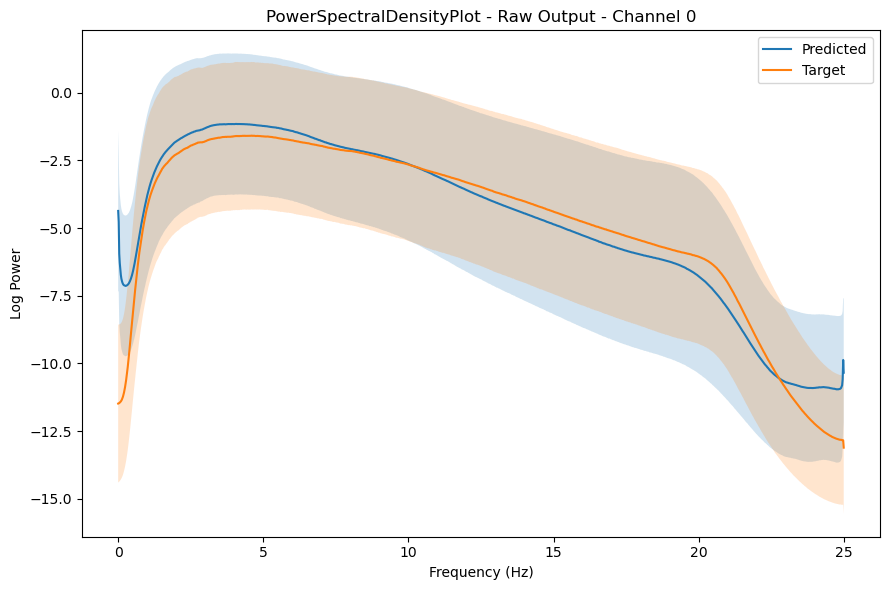

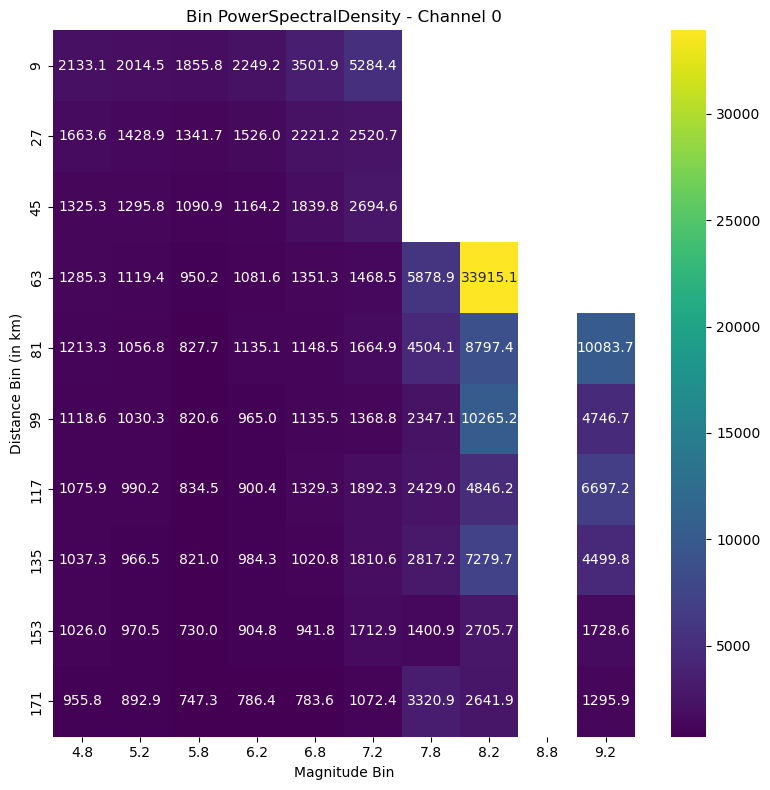

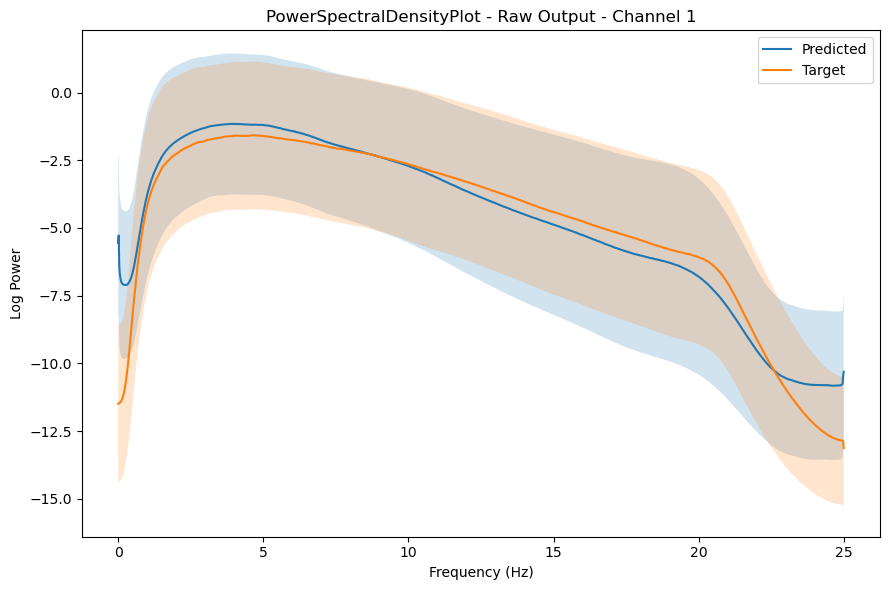

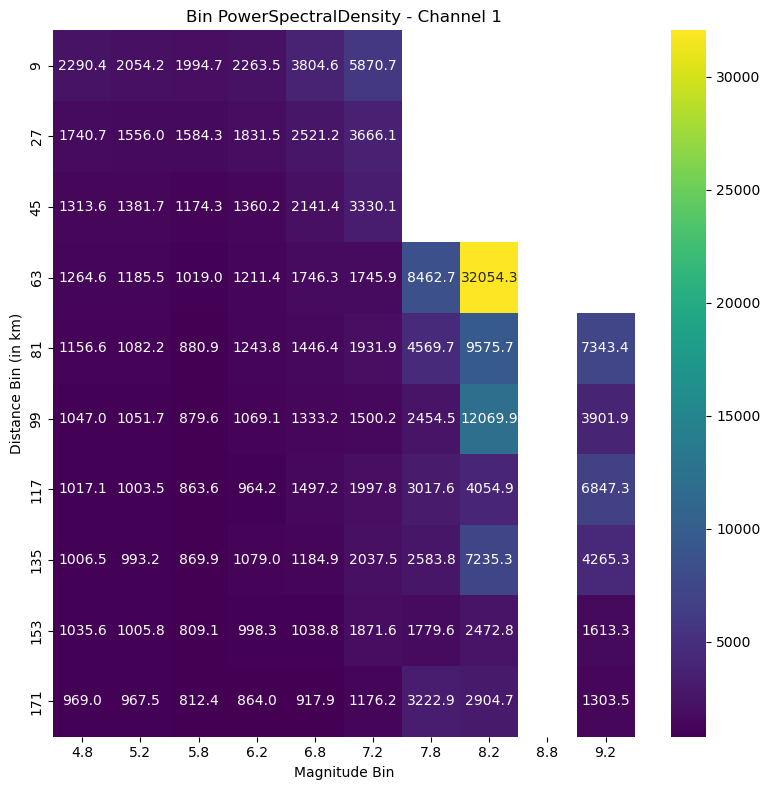

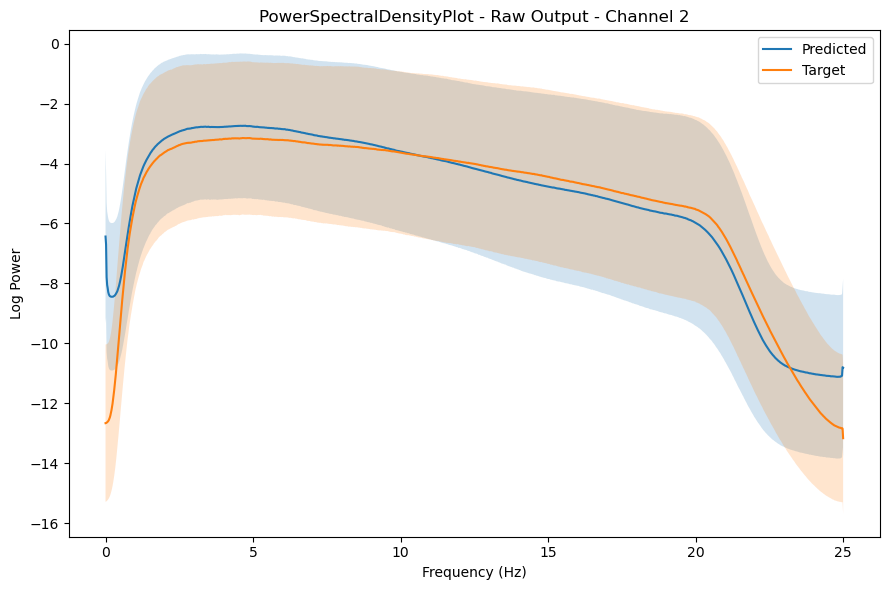

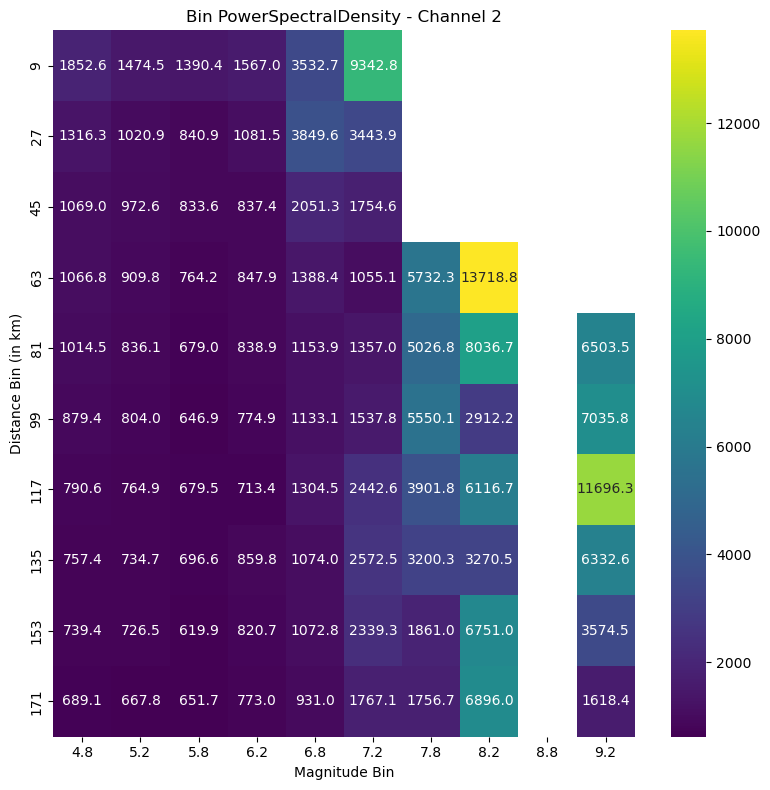

In [20]:
from tqdne.plot import PowerSpectralDensityPlot, BinPlot
from tqdne.metric import PowerSpectralDensity

psd_metrics = [PowerSpectralDensity(fs, channel=channel, invert_representation=False) for channel in range(n_channels)]
psd_plots = [PowerSpectralDensityPlot(fs, channel, invert_representation=False) for channel in range(n_channels)]
for i, psd in enumerate(psd_metrics):
    psd_plots[i](preds=generated_data['waveforms'], target=real_data['waveforms'][:, :, :signal_length])
    psd(preds=generated_data['waveforms'], target=real_data['waveforms'][:, :, :signal_length])    
    psd_bin = BinPlot(psd, num_mag_bins=10, num_dist_bins=10)
    psd_bin(preds=generated_data, target={"waveforms": real_data['waveforms'], "cond": real_data['cond']})
       

In [14]:
from tqdne.plot import LogEnvelopePlot
from tqdne.metric import LogEnvelope

logenv_metrics = [LogEnvelope(channel=channel, invert_representation=False) for channel in range(n_channels)]
logenv_plots = [LogEnvelopePlot(fs, channel, invert_representation=False) for channel in range(n_channels)]
for i, logenv in enumerate(logenv_metrics):
    logenv_plots[i](preds=generated_data['waveforms'], target=real_data['waveforms'][:, :, :signal_length])
    logenv(preds=generated_data['waveforms'], target=real_data['waveforms'][:, :, :signal_length])    
    logenv_bin = BinPlot(psd, num_mag_bins=10, num_dist_bins=10)
    logenv_bin(preds=generated_data, target={"waveforms": real_data['waveforms'], "cond": real_data['cond']})

NameError: name 'real_data' is not defined

In [ ]:
del real_data

### Evaluation using a classifier

In [15]:
classifier_path = Path("/users/abosisio/scratch/tqdne/outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=19-val_loss=1.02.ckpt")
classifier, classifier_data_repr, classifier_ckpt = load_model(classifier_path, use_ddim=False)
classifier_ckpt

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


'/users/abosisio/scratch/tqdne/outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=19-val_loss=1.02.ckpt'

#### Compute Fréchet Inception Distance (FID)

In [ ]:
from tqdne.metric import compute_fid

fid_train_vs_test = compute_fid(
    classifier.get_embeddings(train_dataloader, classifier_data_repr), 
    classifier.get_embeddings(test_dataloader, classifier_data_repr)
)
print(f"FID baseline (train (N={len(train_dataset)}) vs test (N={len(test_dataset)})): {fid_train_vs_test}")

In [16]:
from tqdne.metric import compute_fid

fid_real_vs_generated = compute_fid(
    classifier.get_embeddings(real_dataloader, classifier_data_repr), 
    classifier.get_embeddings(generated_data['waveforms'], classifier_data_repr)
)
print(f"FID (real (N={len(real_dataset)}) vs generated (N={generated_data['waveforms'].shape[0]})): {fid_real_vs_generated}")

Getting embeddings


100%|██████████| 1661/1661 [12:45<00:00,  2.17it/s]


Getting embeddings


100%|██████████| 256/256 [11:33<00:00,  2.71s/it]


FID (real (N=212598) vs generated (N=244962)): 50.60432052612305


#### Compute Inception Score

In [20]:
from tqdne.metric import compute_inception_score

print("Inception Score:", compute_inception_score(classifier.get_probabilities(generated_data['waveforms'], classifier_data_repr)))

100%|██████████| 256/256 [11:37<00:00,  2.73s/it]

Inception Score: 3.038785604666039


## TODOs

In [ ]:
# TODO: widgets do not work

# from tqdne.metric import PowerSpectralDensity, BinMetric
# import ipywidgets as widgets
# from functools import partial

# metrics = {"Power Spectral Density": partial(PowerSpectralDensity, fs=config.fs)}

# # Create a dropdown for selecting the metric
# metric_dropdown = widgets.Dropdown(
#     options=metrics.keys(),
#     description='Metric:',
# )

# # Create a slider for selecting the channel
# channel_slider = widgets.IntSlider(
#     value=0,
#     min=0,
#     max=2,
#     step=1,
#     description='Channel:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )


# # Bin plot checkbox
# bin_plot_checkbox = widgets.Checkbox(
#     value=False,
#     description='Plot bins',
#     disabled=False,
#     indent=True,
# )

# # Create a slider for selecting the number of bins
# num_bins_slider = widgets.IntSlider(
#     value=10,
#     min=1,
#     max=50,
#     step=1,
#     description='Num bins:',
#     disabled=False,
#     continuous_update=False,
#     orientation='horizontal',
#     readout=True,
#     readout_format='d'
# )

# # Function to update the plot
# def update_plot(metric_name, bin_plot, num_bins=10, channel=0):
#     metric = metrics[metric_name](channel=channel)
#     if bin_plot:
#         metric = BinMetric(metric, num_mag_bins=num_bins, num_dist_bins=num_bins)

#     # Compute the metric
#     metric.reset()
#     metric.update(pred={"generated": pred_waveforms}, target={"representation": test_waveforms[:, :, : pred_waveforms.shape[-1]], "cond": test_features})
#     metric.plot().show()

# # Create interactive plot
# widgets.interact(update_plot, metric_name=metric_dropdown, channel=channel_slider, bin_plot=bin_plot_checkbox, num_bins=num_bins_slider)



In [ ]:
print('done')

In [ ]:
# # Save the data to obspy format
# from obspy import Stream, Trace

# # Convert waveforms to Trace objects
# traces = [Trace(data=waveform, header={k:v for k, v in get_cond_params_dict(pred_data["cond"][i])}) for i, waveform in enumerate(pred_data["waveforms"])]

# # Create a Stream object
# st = Stream(traces=traces)

# # Save the Stream object to a file
# st.write("generated_waveforms.mseed", format="MSEED", reclen=512, encoding="FLOAT64")
